In [71]:
import numpy as np
import math as mt
import matplotlib.pyplot as plt
import random
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import accuracy_score
import pandas as pd
import os
from IPython.display import Image
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import warnings
warnings.simplefilter("ignore")

# Mesures de discrimination

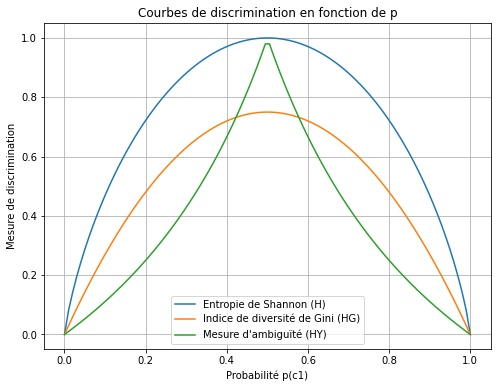

In [12]:
# Fonction pour calculer l'entropie de Shannon
def shannon_entropy(p):
    if p == 0 or p == 1:
        return 0
    return -p * np.log2(p) - (1 - p) * np.log2(1 - p)

# Fonction pour calculer l'indice de diversité de Gini
def gini_index(p):
#     return 2 * p * (1 - p)
    return p*(1 - p**2) + (1-p)*(1 - (1-p)**2)

# Fonction pour calculer la mesure d'ambiguïté
def ambiguity_measure(p):
    # Éviter les valeurs de log(0) et les divisions par zéro
    if p > 1 / 2:
        return np.log2(2) * (1 - p) / p
    else:
        return np.log2(2) * p / (1 - p)

# Création d'une plage de valeurs de p
p_values = np.linspace(0, 1, 100)

# Calcul des valeurs correspondantes de H, HG et HY
h_values = [shannon_entropy(p) for p in p_values]
hg_values = [gini_index(p) for p in p_values]
hy_values = [ambiguity_measure(p) for p in p_values]

# Tracé des courbes
plt.figure(figsize=(8, 6))
plt.plot(p_values, h_values, label="Entropie de Shannon (H)")
plt.plot(p_values, hg_values, label="Indice de diversité de Gini (HG)")
plt.plot(p_values, hy_values, label="Mesure d'ambiguïté (HY)")
plt.xlabel("Probabilité p(c1)")
plt.ylabel("Mesure de discrimination")
plt.legend()
plt.grid(True)
plt.title("Courbes de discrimination en fonction de p")
plt.show()


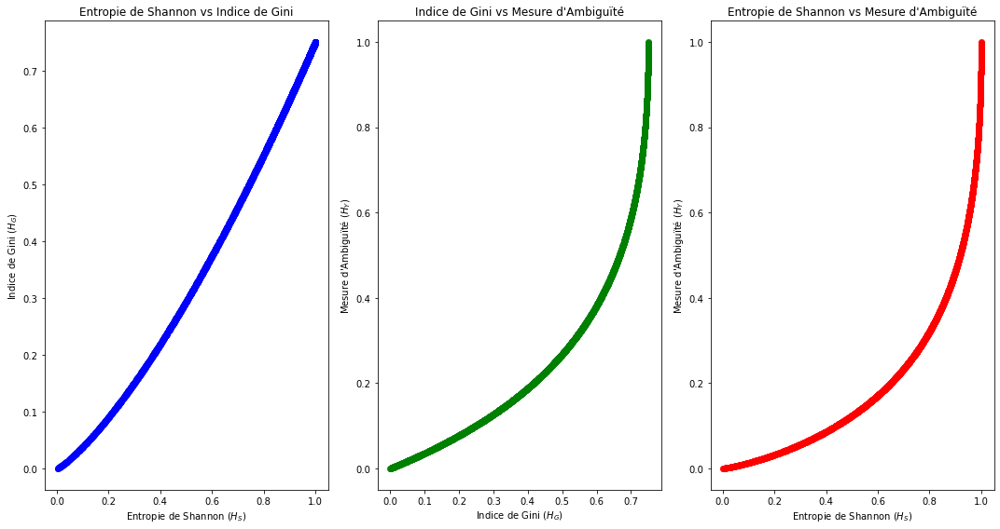

In [26]:
import random

# Nombre de tirages aléatoires
num_samples = 5000

# Tirer des valeurs aléatoires de p et calculer les mesures correspondantes
random_p_values = [random.uniform(0, 1) for _ in range(num_samples)]
measures = [(shannon_entropy(p), gini_index(p), ambiguity_measure(p)) for p in random_p_values]
hs_samples, hg_samples, hy_samples = zip(*measures)

# Figures
fig, axs = plt.subplots(1,3, figsize=(15,8))
# Shannon vs Gini
axs[0].scatter(hs_samples, hg_samples, color="blue", alpha=0.5)
axs[0].set_title("Entropie de Shannon vs Indice de Gini")
axs[0].set_xlabel("Entropie de Shannon ($H_S$)")
axs[0].set_ylabel("Indice de Gini ($H_G$)")

# Gini vs Ambiguïté
axs[1].scatter(hg_samples, hy_samples, color="green", alpha=0.5)
axs[1].set_title("Indice de Gini vs Mesure d'Ambiguïté")
axs[1].set_xlabel("Indice de Gini ($H_G$)")
axs[1].set_ylabel("Mesure d'Ambiguïté ($H_Y$)")

# Shannon vs Ambiguïté
axs[2].scatter(hs_samples, hy_samples, color="red", alpha=0.5)
axs[2].set_title("Entropie de Shannon vs Mesure d'Ambiguïté")
axs[2].set_xlabel("Entropie de Shannon ($H_S$)")
axs[2].set_ylabel("Mesure d'Ambiguïté ($H_Y$)")


plt.tight_layout()
plt.show()

- Plus l'entropie est élevée, plus le système est incertain ou désordonné, ce qui signifie qu'il y a une grande diversité de catégories ou de valeurs. Dans le contexte de la discrimination, une faible entropie de Shannon indique une séparation claire entre les catégories, tandis qu'une entropie élevée suggère un mélange ou une confusion entre les catégories.

- Un indice de Gini proche de zéro indique une distribution équitable, tandis qu'un indice de Gini proche de un indique une inégalité maximale, ce qui suggère une séparation nette entre les catégories.

- La mesure d'ambiguïté pourrait être interprétée comme une mesure de la confusion ou de la complexité dans la classification des données. Une mesure d'ambiguïté élevée suggère qu'il est difficile de distinguer clairement les catégories ou de prendre des décisions discriminatoires.

- Les graphiques ci dessus montre que l'entropie de Shannon et l'indice de Gini sont liés(presque la meme courbe). Lorsque l'entropie est maximale (c'est-à-dire lorsque toutes les catégories sont équiprobables), l'indice de Gini est maximal, indiquant une inégalité maximale. À l'inverse, lorsque l'entropie est minimale (toutes les probabilités sont concentrées dans une seule catégorie), l'indice de Gini est minimal, indiquant une égalité.

# Arbres de decision

In [29]:
# Charger les données 'digits'
digits = datasets.load_digits()

In [30]:
X_train, X_test, y_train, y_test = train_test_split(
    digits.data, digits.target, test_size=0.3, random_state=42
)

tree_digits = tree.DecisionTreeClassifier(criterion="entropy")
tree_digits.fit(X_train, y_train)

y_pred = tree_digits.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.4f}%")

Accuracy: 87.7778%


In [36]:
# Charger les données
PATH = "./data/"
elections_data_path = f"{PATH}elections.csv"
elections_data = pd.read_csv(elections_data_path)
elections_data

,Adresse,Majeur?,Nationalite,Label
0,Paris,oui,Francais,1
1,Paris,non,Francais,-1
2,Montpellier,oui,Italien,1
3,Paris,oui,Suisse,-1
4,Strasbourg,non,Italien,-1
5,Strasbourg,non,Francais,-1
6,Strasbourg,oui,Francais,1
7,Montpellier,oui,Suisse,-1


In [37]:
# one hot 
elections_encoded = pd.get_dummies(elections_data)
elections_encoded

,Label,Adresse_Montpellier,Adresse_Paris,Adresse_Strasbourg,Majeur?_non,Majeur?_oui,Nationalite_Francais,Nationalite_Italien,Nationalite_Suisse
0,1,0,1,0,0,1,1,0,0
1,-1,0,1,0,1,0,1,0,0
2,1,1,0,0,0,1,0,1,0
3,-1,0,1,0,0,1,0,0,1
4,-1,0,0,1,1,0,0,1,0
5,-1,0,0,1,1,0,1,0,0
6,1,0,0,1,0,1,1,0,0
7,-1,1,0,0,0,1,0,0,1


In [40]:
y = elections_encoded["Label"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

tree_elections = tree.DecisionTreeClassifier(criterion="entropy")
tree_elections.fit(X_train, y_train)


accuracy_elections = accuracy_score(y_test, y_pred_elections)
print(f"Accuracy: {accuracy_elections * 100:.2f}%")

Accuracy: 100.00%


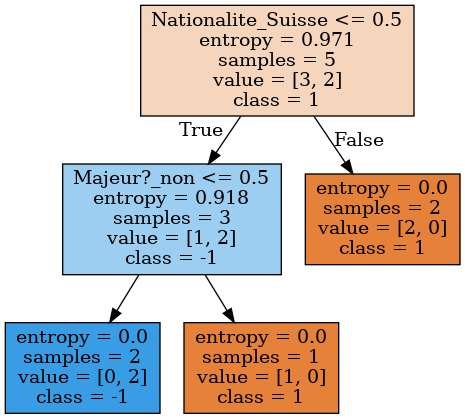

In [42]:
# Génération du fichier .dot représentant l'arbre
out_file = "tree_elections"
dot_file = tree.export_graphviz(
    tree_elections,
    out_file=out_file + ".dot",
    feature_names=X.columns.to_list(),
    class_names=list(map(str, y.unique())),
    filled=True,
)

# Transformation du fichier .dot en fichier .png
os.system(f"dot -T png {out_file}.dot -o {out_file}.png")

# Afficher l'arbre obtenu
Image(filename=out_file + ".png")

In [61]:
from collections import Counter
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

class CustomDecisionTree:
    def __init__(self):
        self.tree = None
        self.data = None

    class Node:
        def __init__(
            self,
            feature=None,
            value=None,
            true_branch=None,
            false_branch=None,
            result=None,
            impurity=None,
        ):
            self.feature = feature
            self.value = value
            self.true_branch = true_branch
            self.false_branch = false_branch
            self.result = result
            self.impurity = impurity

    def fit(self, X, y):
        # Combinez les caractéristiques et les étiquettes
        training_data = pd.concat([X, y], axis=1)
        self.data = training_data
        self.tree = self.build_tree(training_data)

    def predict(self, X):
        predictions = [self.predict_single_entry(entry) for _, entry in X.iterrows()]
        return predictions

    def predict_xai(self, entry):
        explanation, _ = self.trace_tree(entry, self.tree, explanation=[])
        return explanation

    def build_tree(self, data):
        if len(data) == 0:
            return self.Node()

        current_impurity = self.gini(data.iloc[:, -1])
        best_gain = 0
        best_criteria = None
        best_partitions = None

        feature_count = len(data.columns) - 1

        for col in range(feature_count):
            feature_values = data.iloc[:, col].unique()
            for val in feature_values:
                partitioned_data = self.partition(data, data.columns[col], val)

                p = float(partitioned_data[0].shape[0]) / data.shape[0]
                gain = (
                    current_impurity
                    - p * self.gini(partitioned_data[0].iloc[:, -1])
                    - (1 - p) * self.gini(partitioned_data[1].iloc[:, -1])
                )

                if (
                    gain > best_gain
                    and len(partitioned_data[0]) > 0
                    and len(partitioned_data[1]) > 0
                ):
                    best_gain = gain
                    best_criteria = (data.columns[col], val)
                    best_partitions = partitioned_data

        if best_gain > 0:
            true_branch = self.build_tree(best_partitions[0])
            false_branch = self.build_tree(best_partitions[1])
            return self.Node(
                feature=best_criteria[0],
                value=best_criteria[1],
                true_branch=true_branch,
                false_branch=false_branch,
                impurity=current_impurity,
            )
        else:
            outcome = data.iloc[:, -1].value_counts().idxmax()
            return self.Node(result=outcome, impurity=current_impurity)

    def predict_single_entry(self, entry):
        node = self.tree
        while node.result is None:
            if entry[node.feature] == node.value:
                node = node.true_branch
            else:
                node = node.false_branch
        return node.result

    def trace_tree(self, entry, node, explanation):
        if node.result is not None:
            return explanation, node.result

        if entry[node.feature] == node.value:
            explanation.append(f"{node.feature} == {node.value}")
            return self.trace_tree(entry, node.true_branch, explanation)
        else:
            explanation.append(f"{node.feature} != {node.value}")
            return self.trace_tree(entry, node.false_branch, explanation)

    def partition(self, data, feature, value):
        true_data = data[data[feature] == value]
        false_data = data[data[feature] != value]
        return (true_data, false_data)

    def gini(self, labels):
        impurity = 1
        label_counts = Counter(labels)
        for label in label_counts:
            prob_of_label = label_counts[label] / float(len(labels))
            impurity -= prob_of_label**2
        return impurity

    def display_tree(self, node=None, indent="", branch=""):
        if node is None:
            node = self.tree

        if node.result is not None:
            print(f"{indent}{branch}Class: {node.result}")
            return

        print(
            f"{indent}{branch}{node.feature} == {node.value}? (Impurity = {node.impurity:.4f})"
        )

        new_indent = indent + ("│   " if branch == "├── " else "    ")

        self.display_tree(node.true_branch, new_indent, "├── ")
        self.display_tree(node.false_branch, new_indent, "└── ")

In [62]:
# Séparer les caractéristiques et les étiquettes
chemin_donnees_elections = "./data/elections.csv"
donnees_elections = pd.read_csv(chemin_donnees_elections)
X = donnees_elections.drop("Label", axis=1)
y = donnees_elections["Label"]

# Diviser les données en ensembles d'entraînement et de test
X_entrainement, X_test, y_entrainement, y_test = train_test_split(
    X, y, test_size=0.3, random_state=25
)

# Initialiser et entraîner l'arbre de décision personnalisé
arbre_decision_personnalise = CustomDecisionTree()
arbre_decision_personnalise.fit(X_entrainement, y_entrainement)

# Évaluer la précision de l'arbre de décision
predictions = arbre_decision_personnalise.predict(X_test)
precision = accuracy_score(y_test, predictions)
print(f"Précision : {precision * 100:.2f}%\n")

# Visualisation
arbre_decision_personnalise.display_tree()

Précision : 100.00%

Majeur? == non? (Impurity = 0.4800)
    ├── Class: -1
    └── Nationalite == Suisse? (Impurity = 0.4444)
        ├── Class: -1
        └── Class: 1


In [66]:
predictions = arbre_decision_personnalise.predict(X)

for i, sample in X.iterrows():
    print("<>" * 20, "Personne", i, "<>" * 20)
    print(f"Prédiction  : {predictions[i]}")
    print(f"Explication : {arbre_decision_personnalise.predict_xai(sample)} \n")

<><><><><><><><><><><><><><><><><><><><> Personne 0 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : 1
Explication : ['Majeur? != non', 'Nationalite != Suisse'] 

<><><><><><><><><><><><><><><><><><><><> Personne 1 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : -1
Explication : ['Majeur? == non'] 

<><><><><><><><><><><><><><><><><><><><> Personne 2 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : 1
Explication : ['Majeur? != non', 'Nationalite != Suisse'] 

<><><><><><><><><><><><><><><><><><><><> Personne 3 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : -1
Explication : ['Majeur? != non', 'Nationalite == Suisse'] 

<><><><><><><><><><><><><><><><><><><><> Personne 4 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : -1
Explication : ['Majeur? == non'] 

<><><><><><><><><><><><><><><><><><><><> Personne 5 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : -1
Explication : ['Majeur? == non'] 

<><><><><><><><><><><><><><><><><><><><> Personne 6 <><><

## Comparaison avec LIME

In [69]:
X = elections_data.drop("Label", axis=1)
y = elections_data["Label"]
feature_names = X.columns.to_list()
class_names = y.unique().astype("str")

data = X.to_numpy()
categorical_names = {}
categorical_features = range(len(feature_names))
for feature in categorical_features:
    le = LabelEncoder()
    le.fit(data[:, feature])
    data[:, feature] = le.transform(data[:, feature])
    categorical_names[feature] = le.classes_

data = data.astype(float)
X_train, X_test, y_train, y_test = train_test_split(
    data, y, test_size=0.3, random_state=42
)

encoder = OneHotEncoder()
encoder.fit(data)
encoded_train = encoder.transform(X_train)

clf = tree.DecisionTreeClassifier(criterion="entropy", random_state=42)
clf.fit(encoded_train, y_train)

accuracy = accuracy_score(y_test, clf.predict(encoder.transform(X_test)))
print(f"Accuracy: {accuracy * 100:.4f}%")

Accuracy: 100.0000%


In [72]:
def predict_fn(x):
    return tree_elections.predict_proba(encoder.transform(x))


explainer = LimeTabularExplainer(
    X_train,
    class_names=y.unique().astype("str"),
    feature_names=feature_names,
    categorical_features=range(3),
    categorical_names=categorical_names,
    verbose=False,
)

In [73]:
for i, sample in X.iterrows():
    print("<>" * 20, "Personne", i, "<>" * 20)
    exp = explainer.explain_instance(data[i], predict_fn, num_features=5)
    exp.show_in_notebook()

<><><><><><><><><><><><><><><><><><><><> Personne 0 <><><><><><><><><><><><><><><><><><><><>


<><><><><><><><><><><><><><><><><><><><> Personne 1 <><><><><><><><><><><><><><><><><><><><>


<><><><><><><><><><><><><><><><><><><><> Personne 2 <><><><><><><><><><><><><><><><><><><><>


<><><><><><><><><><><><><><><><><><><><> Personne 3 <><><><><><><><><><><><><><><><><><><><>


<><><><><><><><><><><><><><><><><><><><> Personne 4 <><><><><><><><><><><><><><><><><><><><>


<><><><><><><><><><><><><><><><><><><><> Personne 5 <><><><><><><><><><><><><><><><><><><><>


<><><><><><><><><><><><><><><><><><><><> Personne 6 <><><><><><><><><><><><><><><><><><><><>


<><><><><><><><><><><><><><><><><><><><> Personne 7 <><><><><><><><><><><><><><><><><><><><>


# Mushrooms Data

In [74]:
# Vérifier les fichiers extraits et trouver les fichiers de données "Mushrooms"
mushroom_data_path = f"./data/"
extracted_files = os.listdir(mushroom_data_path)
mushroom_files = [file for file in extracted_files if file.startswith("mushroom")]

# Charger les données de chaque fichier mushroom et les combiner en un seul DataFrame
mushroom_dataframes = [
    pd.read_csv(os.path.join(mushroom_data_path, file)) for file in mushroom_files
]
combined_mushroom_data = pd.concat(mushroom_dataframes, ignore_index=True)

# Afficher les premières lignes des données combinées
combined_mushroom_data.head()

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,y,n,f,y,f,c,n,b,...,s,p,w,p,w,o,e,w,v,d
1,p,x,s,n,f,y,f,c,n,b,...,k,p,w,p,w,o,e,w,v,l
2,p,x,f,y,f,f,f,c,b,g,...,k,b,p,p,w,o,l,h,v,d
3,p,x,f,y,f,f,f,c,b,g,...,k,n,b,p,w,o,l,h,y,g
4,p,x,f,y,f,f,f,c,b,h,...,k,p,b,p,w,o,l,h,y,d


In [78]:
# Séparer les caractéristiques et les étiquettes
X_mushrooms = combined_mushroom_data.drop(columns=["class"])  # features
y_mushrooms = combined_mushroom_data["class"]  # labels

# Diviser les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(
    X_mushrooms, y_mushrooms, test_size=0.4, random_state=42
)

# Initialiser et entraîner l'arbre de décision symbolique
tree_mushroom = CustomDecisionTree()
tree_mushroom.fit(X_train, y_train)

y_pred_mushrooms = tree_mushroom.predict(X_test)

# Évaluer la précision de l'arbre de décision
accuracy_mushrooms = accuracy_score(y_test, y_pred_mushrooms)
print(f"Accuracy: {accuracy_mushrooms * 100:.2f}% \n")

# Visualisation
tree_mushroom.display_tree()

Accuracy: 100.00% 

odor == n? (Impurity = 0.4998)
    ├── spore-print-color == r? (Impurity = 0.0724)
    │   ├── Class: p
    │   └── stalk-surface-below-ring == y? (Impurity = 0.0311)
    │       ├── gill-size == n? (Impurity = 0.3599)
    │       │   ├── Class: p
    │       │   └── Class: e
    │       └── cap-surface == g? (Impurity = 0.0060)
    │           ├── Class: p
    │           └── cap-shape == c? (Impurity = 0.0030)
    │               ├── Class: p
    │               └── gill-size == b? (Impurity = 0.0020)
    │                   ├── Class: e
    │                   └── bruises == f? (Impurity = 0.0317)
    │                       ├── Class: e
    │                       └── Class: p
    └── stalk-root == c? (Impurity = 0.2888)
        ├── bruises == t? (Impurity = 0.1482)
        │   ├── Class: e
        │   └── Class: p
        └── stalk-root == r? (Impurity = 0.1368)
            ├── Class: e
            └── odor == a? (Impurity = 0.0499)
                ├── Class: e

In [81]:
pred_mushrooms = tree_mushroom.predict(X_mushrooms)

for i, sample in X.iterrows():
    print("<>" * 20, "Personne", i, "<>" * 20)
    print(f"Prédiction  : {pred_mushrooms[i]}")
    print(f"Explication : {tree_mushroom.predict_xai(X_mushrooms.iloc[i])} \n")

<><><><><><><><><><><><><><><><><><><><> Personne 0 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : p
Explication : ['odor != n', 'stalk-root != c', 'stalk-root != r', 'odor != a', 'odor != l'] 

<><><><><><><><><><><><><><><><><><><><> Personne 1 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : p
Explication : ['odor != n', 'stalk-root != c', 'stalk-root != r', 'odor != a', 'odor != l'] 

<><><><><><><><><><><><><><><><><><><><> Personne 2 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : p
Explication : ['odor != n', 'stalk-root != c', 'stalk-root != r', 'odor != a', 'odor != l'] 

<><><><><><><><><><><><><><><><><><><><> Personne 3 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : p
Explication : ['odor != n', 'stalk-root != c', 'stalk-root != r', 'odor != a', 'odor != l'] 

<><><><><><><><><><><><><><><><><><><><> Personne 4 <><><><><><><><><><><><><><><><><><><><>
Prédiction  : p
Explication : ['odor != n', 'stalk-root != c', 'stalk-root != r', 'odor != a', 